Plot 2D gel projections and radial number densities for all different kinds of particles involved in the simulation (beads, MNPs)

In [1]:
import sys

sys.path.append("../")

In [2]:
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from matplotlib.patches import Circle

from common import GelDir
from analysis.distribution import rnd_from_file
from utils.mymath import online_mean_and_ci

In [3]:
MAX_TIME_COLS = 5


def stepsize(data):
    return max(1, len(data) // (MAX_TIME_COLS - 2))

# Equilibration

In [4]:
def extract_timestep(p: Path, ptype: str) -> int:
    return int(p.stem.split("_")[0 if ptype == "Agent" else -1])


def get_point_files(gel_dir: GelDir) -> pd.DataFrame:
    records = []

    for p in gel_dir.raw_data_path.rglob("*.npy"):
        ptype = ""
        if "MNP" in p.name:
            ptype = "MNP"
        elif "Bead" in p.name:
            ptype = "Bead"
        elif "agent" in p.name:
            ptype = "Agent"
        else:
            raise ValueError(f"Unknown file {p}")

        stage = ""
        if "diffusion" in p.parent.name:
            stage = "Agent Diffusion"
        elif "agents" in p.parent.name:
            stage = "Crosslinking"
        elif p.parent.name == "gel_eq":
            stage = "Gel Eq"
        elif "mmgel_eq" in p.parent.name:
            stage = "MMGel Eq"
        else:
            raise ValueError(f"Unknown directory {p.parent} of file {p.name}")

        records.append(
            {
                "path": p,
                "timestep": extract_timestep(p, ptype),
                "stage": stage,
                "ptype": ptype,
            }
        )

    if not records:
        return pd.DataFrame()
    df = pd.DataFrame.from_records(records).sort_values("timestep")

    # fix timesteps
    # but not these because then gel eq bead files will have different timesteps because of differently long crosslinking stages
    # maybe if needed introduce another column: "Real Time" e.g.
    # df.loc[df["ptype"] == "Agent", "timestep"] += gel_dir.config.steps_melt_eq_max
    # df.loc[df["stage"] == "Gel Eq", "timestep"] += df[df["ptype"] == "Agent"]["timestep"].max()
    # okay, problem: They don't have the same timesteps anyways, because some gels did start with 6e6 timesteps and thus bigger steps between saves than others.
    df.loc[df["stage"] == "MMGel Eq", "timestep"] += df[df["stage"] == "Gel Eq"]["timestep"].max()

    df["forcefield"] = gel_dir.config.agent_force_field
    df["meshw"] = gel_dir.config.crosslink_percentage
    df["vf"] = gel_dir.config.volume_fraction
    df["charge"] = gel_dir.config.charge_per_bead
    df["run"] = gel_dir.path.name.split("_")[1]
    df["seed"] = gel_dir.config.seed

    categorical_cols = ["run", "stage", "ptype", "forcefield", "charge", "meshw", "vf"]
    df[categorical_cols] = df[categorical_cols].astype("category")

    return df

In [ ]:
# base_dir = Path().home() / "data/mmgel/production4/"
base_dir = Path("../../data/raw/30112024_forcefield_eq_time_fixed")
if not base_dir.exists():
    raise

In [6]:
gel_dir_paths = [p for p in base_dir.iterdir() if GelDir.is_gel_dir(p)]
points_df = pd.concat([get_point_files(GelDir(p)) for p in gel_dir_paths], ignore_index=True)
points_df

,path,timestep,stage,ptype,forcefield,meshw,vf,charge,run,seed
0,../../data/raw/30112024_forcefield_eq_time_fix...,0,Agent Diffusion,Agent,exp,0.7,0.45,0.05,ff=exp,95399302
1,../../data/raw/30112024_forcefield_eq_time_fix...,500,Agent Diffusion,Agent,exp,0.7,0.45,0.05,ff=exp,95399302
2,../../data/raw/30112024_forcefield_eq_time_fix...,1000,Agent Diffusion,Agent,exp,0.7,0.45,0.05,ff=exp,95399302
3,../../data/raw/30112024_forcefield_eq_time_fix...,1500,Agent Diffusion,Agent,exp,0.7,0.45,0.05,ff=exp,95399302
4,../../data/raw/30112024_forcefield_eq_time_fix...,2000,Agent Diffusion,Agent,exp,0.7,0.45,0.05,ff=exp,95399302
...,...,...,...,...,...,...,...,...,...,...
6371,../../data/raw/30112024_forcefield_eq_time_fix...,80000,Gel Eq,Bead,none,0.2,0.30,0.15,ff=none,66984208
6372,../../data/raw/30112024_forcefield_eq_time_fix...,85000,Gel Eq,Bead,none,0.2,0.30,0.15,ff=none,66984208
6373,../../data/raw/30112024_forcefield_eq_time_fix...,90000,Gel Eq,Bead,none,0.2,0.30,0.15,ff=none,66984208
6374,../../data/raw/30112024_forcefield_eq_time_fix...,95000,Gel Eq,Bead,none,0.2,0.30,0.15,ff=none,66984208


## 2D Projection of Particles over Time (left to right)

In [7]:
def indices_of_closest(values, targets):
    indices = []
    for target in targets:
        # Compute the absolute differences between the target and each value in values
        closest_index = min(range(len(values)), key=lambda i: abs(values[i] - target))
        indices.append(closest_index)
    return indices


import random


def test_indices_of_closest(num_tests=100, values_range=(0, 100), num_values=10, num_targets=5):
    for _ in range(num_tests):
        # Generate random values and targets
        values = [random.randint(*values_range) for _ in range(num_values)]
        targets = [random.randint(*values_range) for _ in range(num_targets)]

        indices = indices_of_closest(values, targets)

        # Ensure the length of indices matches the number of targets
        assert len(indices) == len(targets)

        # Check the assertion for each target
        closest_values = [values[idx] for idx in indices]
        for i, t in enumerate(targets):
            # Assert that the closest value is indeed the closest
            assert abs(t - closest_values[i]) == min(abs(t - v) for v in values)

    print(f"All {num_tests} tests passed!")


test_indices_of_closest(num_tests=100)


All 100 tests passed!


In [8]:
def get_df_subset(full_df):
    sub_indices = []

    for seed, group in full_df.groupby("seed"):
        selected_indices = group.index[np.linspace(0, len(group.index) - 1, MAX_TIME_COLS, endpoint=True, dtype=int)]
        sub_indices.extend(sorted(set(selected_indices)))
        assert len(selected_indices) == MAX_TIME_COLS, len(selected_indices)

    return full_df.loc[sub_indices]


def get_df_subset2(full_df, n: int):
    dfs = []
    for seed, group in full_df.groupby("seed"):
        selected_indices = np.linspace(0, len(group) - 1, n, endpoint=True).astype(int)

        dfs.append(group.iloc[selected_indices].copy())
        dfs[-1]["num"] = list(range(len(dfs[-1])))

    return pd.concat(dfs, ignore_index=True)


def get_df_subset4(full_df, n: int):
    assert len(full_df["stage"].unique()) == 1

    start_end_per_stage = {
        stage: (sub_df["timestep"].min(), sub_df["timestep"].max()) for stage, sub_df in full_df.groupby("stage")
    }

    dfs = []
    for seed, group in full_df.groupby("seed"):
        assert len(group) > 0, (seed, group)
        # I get problems if I have multiple stages here, thus the initial requirement
        stage = group["stage"].iloc[0]
        start, end = start_end_per_stage[stage]
        timestep_orientations = np.linspace(start, end, n, endpoint=True)
        vals = group["timestep"].tolist()
        selected_indices = indices_of_closest(vals, timestep_orientations)
        assert len(selected_indices) == n

        # throw out ones with too large difference
        selected_indices = [i for i, t in zip(selected_indices, timestep_orientations) if abs(t - vals[i]) <= 10**4]

        selected_indices = sorted(set(selected_indices))

        dfs.append(group.iloc[selected_indices].copy())
        dfs[-1]["num"] = list(range(len(dfs[-1])))

    return pd.concat(dfs, ignore_index=True)


# get_df_subset4(points_df[points_df["stage"] == "Gel Eq"], 4)

In [9]:
# for num, sub_df in get_df_subset4(points_df[points_df["stage"] == "Gel Eq"], 4).groupby("num"):
#     timesteps = sub_df["timestep"].unique()
#     print(num)
#     # print(timesteps)
#     print(timesteps.min(), timesteps.max())
#     print(timesteps.max() - timesteps.min())
#     print()

In [10]:
MAX_PLOT_POINTS = 20


def scatter_subset(data, color, just_slice: bool = False, **kwargs):
    global MAX_PLOT_POINTS
    all_points = []
    coms = []
    for idx, row in data.iterrows():
        points_per_row = max(1, MAX_PLOT_POINTS // len(data))
        points = np.load(row["path"])
        coms.append(points.mean(axis=0))
        np.random.shuffle(points)
        all_points.append(points[:points_per_row])
    all_points = np.concatenate(all_points, axis=0)
    assert all_points.shape[1] == 3 and all_points.ndim == 2, all_points.shape

    com = np.mean(coms, axis=0)
    if just_slice:
        all_points = all_points[np.abs(all_points[:, -1] - com[-1]) < 1]

    plt.plot(*all_points[:, :2].T, ".", color=color)

    gel_dir = GelDir.from_inner(data["path"].iloc[0])
    R = gel_dir.config.constraint_radius
    plt.gca().add_patch(Circle(com[:2], R, fill=False))

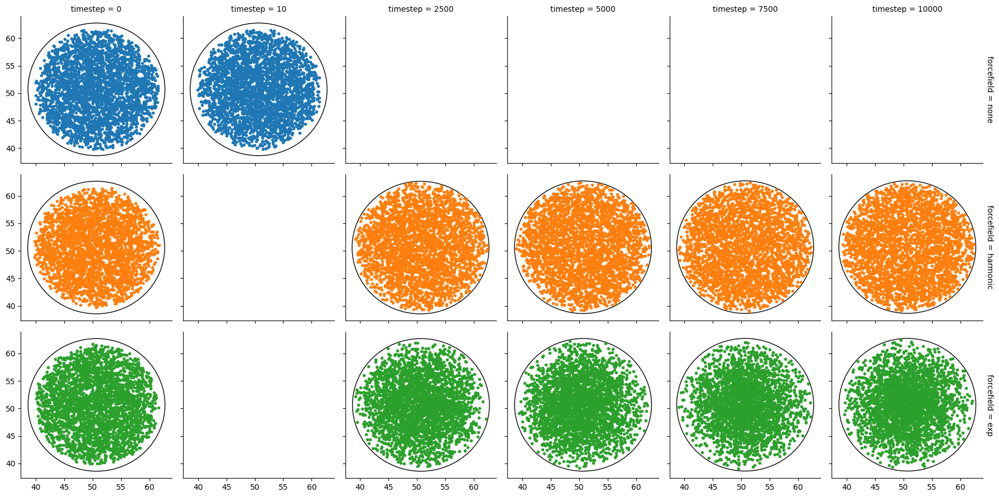

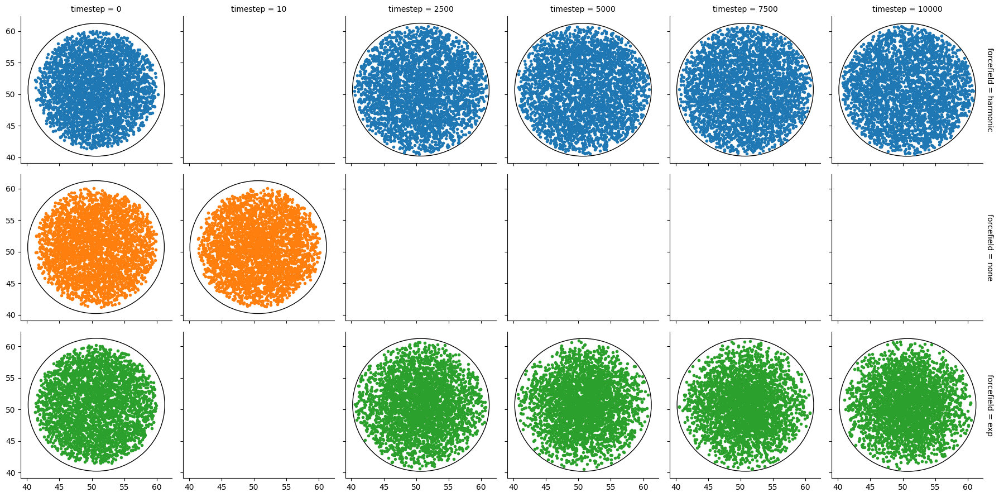

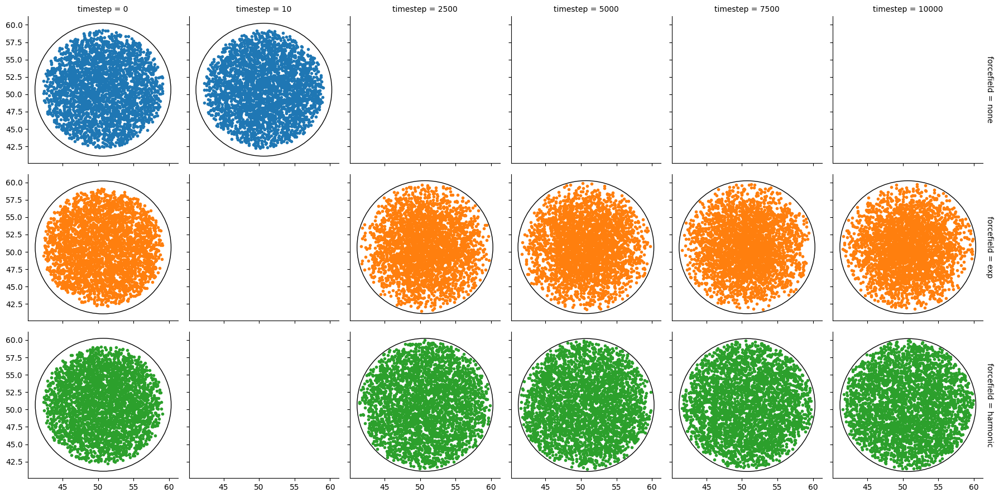

In [11]:
MAX_PLOT_POINTS = 40 * 80
agents_diff_df = points_df[points_df["stage"] == "Agent Diffusion"]
for vf, sub_df in agents_diff_df.groupby("vf"):
    sub_df = sub_df[sub_df["meshw"] == 0.7]
    g = sns.FacetGrid(get_df_subset(sub_df), hue="forcefield", col="timestep", row="forcefield", margin_titles=True)
    g.map_dataframe(scatter_subset)
    plt.show()

## Slices of the same thing to uncover empty spots hidden by 2D projection

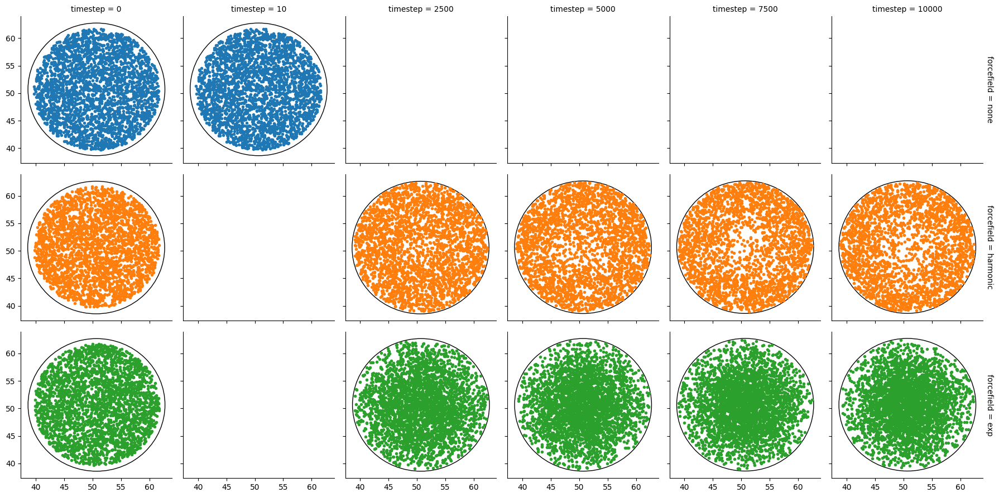

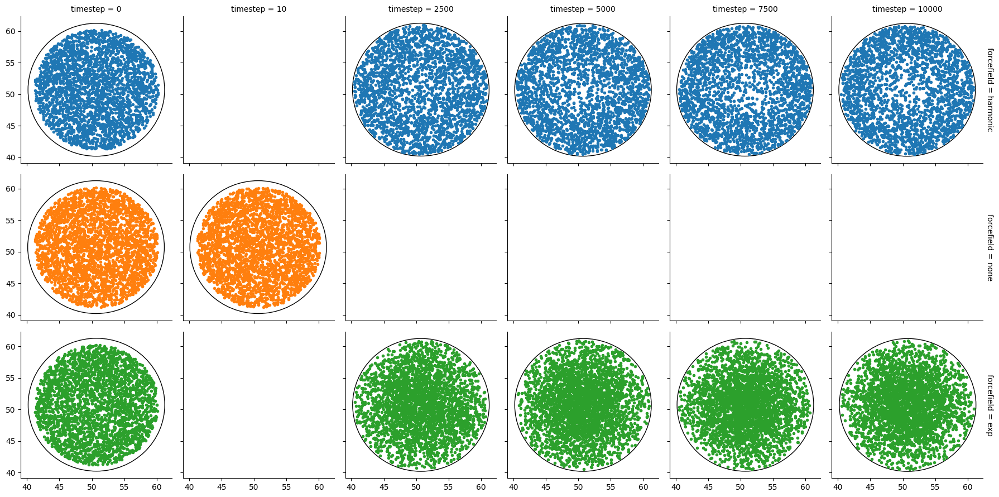

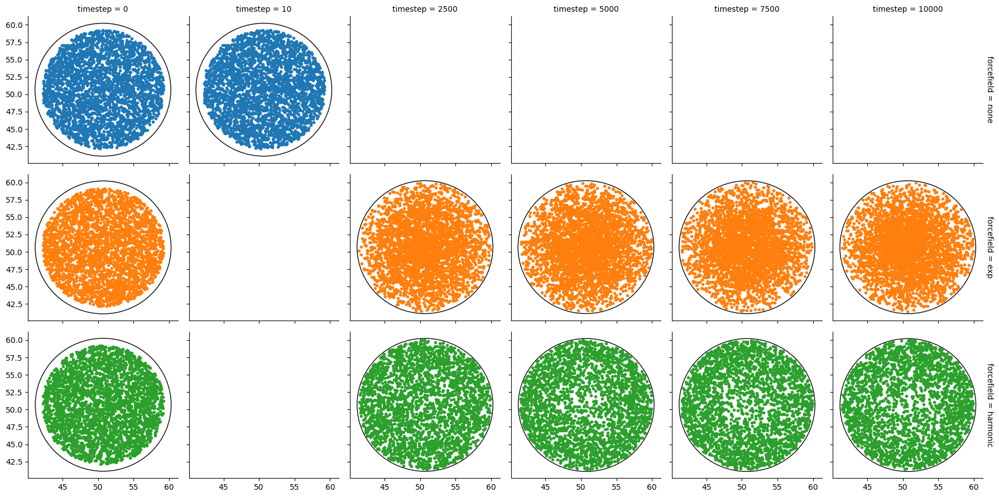

In [12]:
def scatterplot_wrapper(data, **kwargs):
    scatter_subset(data, just_slice=True, **kwargs)


MAX_PLOT_POINTS = 400 * 80
for vf, sub_df in agents_diff_df.groupby("vf"):
    sub_df = sub_df[sub_df["meshw"] == 0.7]
    g = sns.FacetGrid(get_df_subset(sub_df), hue="forcefield", col="timestep", row="forcefield", margin_titles=True)
    g.map_dataframe(scatterplot_wrapper)
    plt.show()

In [13]:
# with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.expand_frame_repr', False):
#     display(get_df_subset2(points_df[points_df["stage"] == "Gel Eq"]))

In [14]:
MAX_PLOT_POINTS = 200 * 80
g = sns.FacetGrid(
    get_df_subset2(points_df[points_df["stage"] == "Gel Eq"], n=6),
    row="seed",
    col="num",
    hue="forcefield",
    margin_titles=True,
    sharex=False,
)
g.map_dataframe(scatter_subset)
for (i, j, k), data in g.facet_data():
    # print(i,j,k, len(data))
    # if len(data) != 1:
    #     display(data)
    assert len(data) <= 1, len(data)
    # len=0 happens due to hue="forcefield"
    if len(data) > 0:
        g.axes[i, j].set_xlabel(f"Timestep: {int(data['timestep'].iloc[0])}")
        g.axes[i, j].set_aspect("equal")
plt.tight_layout()
plt.show()

## Radial Densities

In [15]:
max_constraint_radius = max(GelDir(gel_dir).config.constraint_radius for gel_dir in gel_dir_paths)
max_box_size = max(GelDir(gel_dir).config.initial_box_l for gel_dir in gel_dir_paths)
print(max_constraint_radius, max_box_size)

12.050711320876148 101.4


In [16]:
def lineplot(data, color, **kwargs):
    for idx, row in data.iterrows():
        r, dens = rnd_from_file(row["path"], bins="auto")
        plt.plot(r, dens, color=color, **kwargs)


def load_and_average(data, color, **kwargs):
    if (data["ptype"] == "Agent").all():
        bin_edges = np.linspace(0, max_constraint_radius + 1, int(max_constraint_radius) + 1)
    else:
        bin_edges = np.linspace(0, max_box_size / 2, int(max_box_size / 2) // 2)
    bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2

    mean_density, ci_low, ci_high = online_mean_and_ci(
        data_iterator=(rnd_from_file(p, bins=bin_edges)[1] for p in data["path"]), alpha=0.1
    )

    ax = plt.gca()
    ax.plot(bin_centers, mean_density, color=color, **kwargs)
    ax.fill_between(bin_centers, ci_low, ci_high, color=color, alpha=0.2)

### Agent Distribution after Diffusion

Averages over time and run

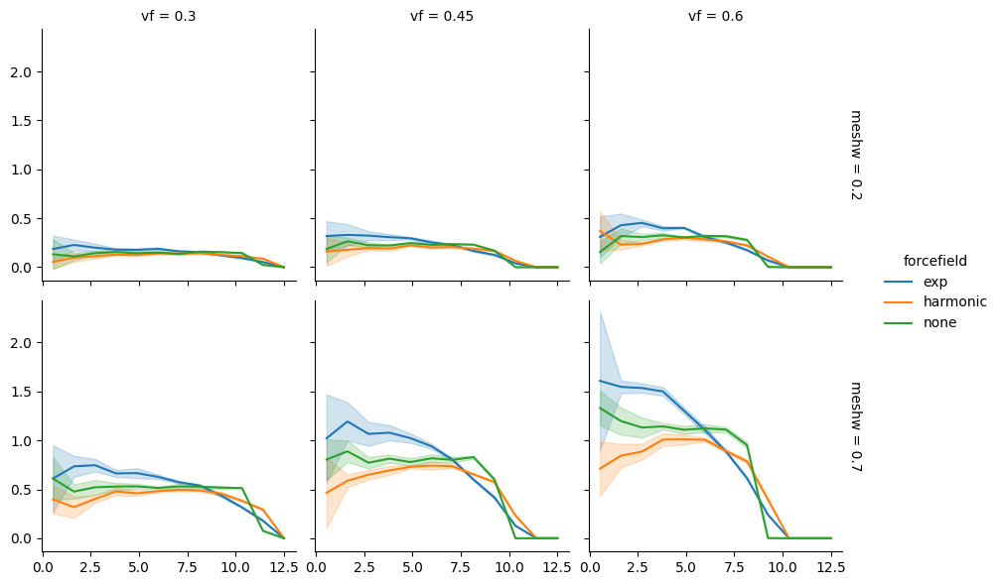

In [17]:
g = sns.FacetGrid(
    points_df[
        (points_df["stage"] == "Agent Diffusion")
        * ((points_df["timestep"] == 10) + (points_df["timestep"] == 1000))
    ],
    row="meshw",
    col="vf",
    hue="forcefield",
    margin_titles=True,
)
g.map_dataframe(load_and_average)
g.add_legend()
plt.show()

### Gel and MMGel Equilibration

In [18]:
points_df.loc[:, "meshw_charge_vf"] = (
    points_df["meshw"].astype(str) + "_" + points_df["charge"].astype(str) + "_" + points_df["vf"].astype(str)
)

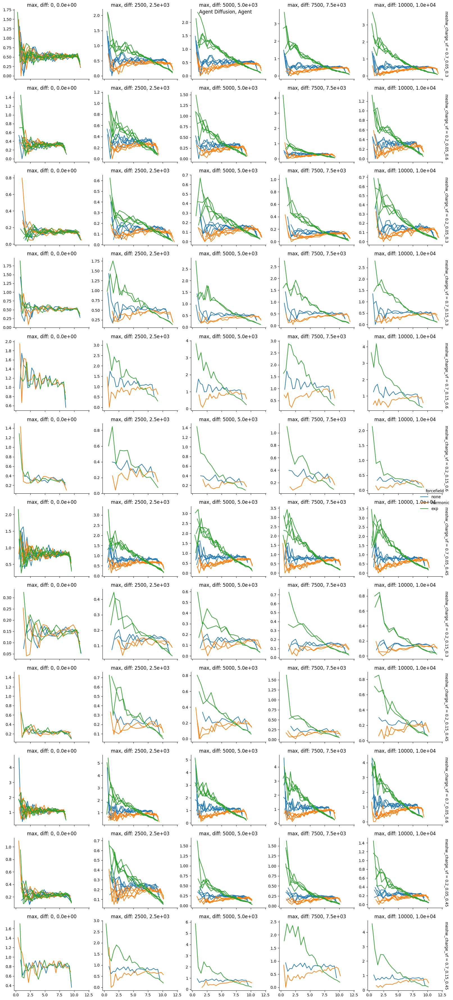

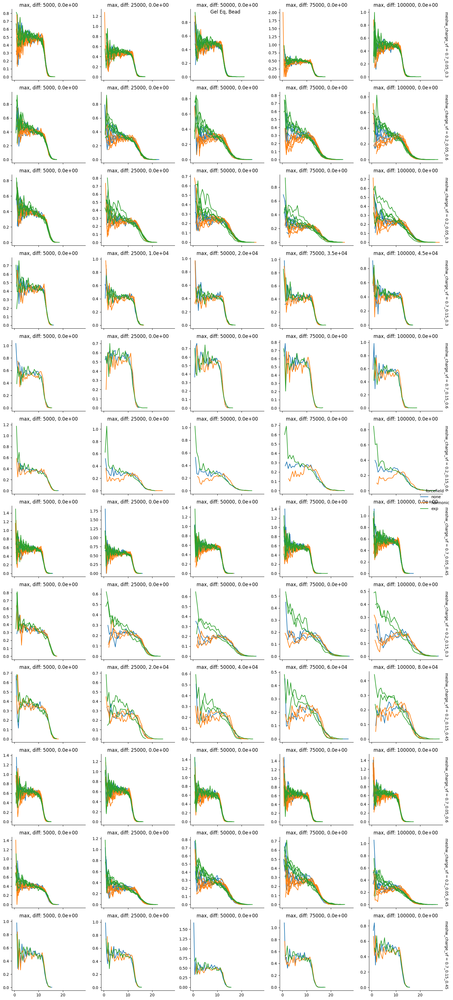

In [19]:
for (stage, ptype), sub_df in points_df.groupby(["stage", "ptype"]):
    if stage not in ["Agent Diffusion", "Gel Eq", "MMGel Eq"]:
        continue

    g = sns.FacetGrid(
        get_df_subset2(sub_df, 5), row="meshw_charge_vf", col="num", hue="forcefield", margin_titles=True, sharey=False
    )
    g.map_dataframe(lineplot)

    g.figure.suptitle(f"{stage}, {ptype}")

    min_max_timestep = dict()
    for (i, j, k), data in g.facet_data():
        if len(data) == 0:
            continue
        current_min = min_max_timestep.get((i, j), (np.inf, -np.inf))[0]
        current_max = min_max_timestep.get((i, j), (np.inf, -np.inf))[1]
        min_max_timestep[(i, j)] = (
            min(current_min, data["timestep"].min()),
            max(current_max, data["timestep"].max()),
        )

    for (i, j, k), data in g.facet_data():
        if len(data) == 0:
            continue
        # g.axes[i,j].set_title(f"Timestep: {str(data['timestep'].tolist())}")
        diff = min_max_timestep[(i, j)][1] - min_max_timestep[(i, j)][0]
        g.axes[i, j].set_title(f"max, diff: {min_max_timestep[(i,j)][1]}, {diff:.1e}")
        # g.axes[i,j].set_aspect("equal")

    g.add_legend()
    plt.tight_layout()

plt.show()

In [20]:
for (i, j, k), data in g.facet_data():
    if len(data) > 0:
        print(f"{len(data)}: ", i, j, k)
    else:
        print("0: ", i, j, k)

5:  0 0 0
5:  0 0 1
5:  0 0 2
5:  0 1 0
5:  0 1 1
5:  0 1 2
5:  0 2 0
5:  0 2 1
5:  0 2 2
5:  0 3 0
5:  0 3 1
5:  0 3 2
5:  0 4 0
5:  0 4 1
5:  0 4 2
5:  1 0 0
5:  1 0 1
5:  1 0 2
5:  1 1 0
5:  1 1 1
5:  1 1 2
5:  1 2 0
5:  1 2 1
5:  1 2 2
5:  1 3 0
5:  1 3 1
5:  1 3 2
5:  1 4 0
5:  1 4 1
5:  1 4 2
5:  2 0 0
5:  2 0 1
5:  2 0 2
5:  2 1 0
5:  2 1 1
5:  2 1 2
5:  2 2 0
5:  2 2 1
5:  2 2 2
5:  2 3 0
5:  2 3 1
5:  2 3 2
5:  2 4 0
5:  2 4 1
5:  2 4 2
2:  3 0 0
2:  3 0 1
2:  3 0 2
2:  3 1 0
2:  3 1 1
2:  3 1 2
2:  3 2 0
2:  3 2 1
2:  3 2 2
2:  3 3 0
2:  3 3 1
2:  3 3 2
2:  3 4 0
2:  3 4 1
2:  3 4 2
1:  4 0 0
1:  4 0 1
1:  4 0 2
1:  4 1 0
1:  4 1 1
1:  4 1 2
1:  4 2 0
1:  4 2 1
1:  4 2 2
1:  4 3 0
1:  4 3 1
1:  4 3 2
1:  4 4 0
1:  4 4 1
1:  4 4 2
1:  5 0 0
1:  5 0 1
1:  5 0 2
1:  5 1 0
1:  5 1 1
1:  5 1 2
1:  5 2 0
1:  5 2 1
1:  5 2 2
1:  5 3 0
1:  5 3 1
1:  5 3 2
1:  5 4 0
1:  5 4 1
1:  5 4 2
5:  6 0 0
5:  6 0 1
5:  6 0 2
5:  6 1 0
5:  6 1 1
5:  6 1 2
5:  6 2 0
5:  6 2 1
5:  6 2 2
5:  6 3 0
